# **1. Import Library**

In [1]:
from google.colab import userdata

import ast
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

# **2. Data Preparation**

In [2]:
# Ambil kredensial dari Google Colab Secrets
kaggle_username = userdata.get('kaggle_username')  # Nama pengguna
kaggle_key = userdata.get('kaggle_key')     # Kunci API

# Set variabel lingkungan untuk Kaggle
os.environ['KAGGLE_USERNAME'] = kaggle_username
os.environ['KAGGLE_KEY'] = kaggle_key

In [3]:
# Download the dataset from Kaggle
!kaggle datasets download -d shriyashjagtap/indian-personal-finance-and-spending-habits

Dataset URL: https://www.kaggle.com/datasets/shriyashjagtap/indian-personal-finance-and-spending-habits
License(s): CC-BY-SA-4.0
  0% 0.00/3.95M [00:00<?, ?B/s]
100% 3.95M/3.95M [00:00<00:00, 270MB/s]


In [4]:
# Unzip the downloaded dataset to extract the files
!unzip indian-personal-finance-and-spending-habits.zip

Archive:  indian-personal-finance-and-spending-habits.zip
  inflating: data.csv                


In [5]:
# Load the CSV file
df = pd.read_csv('data.csv')

In [6]:
# Display the first five rows of the dataset to get an overview of the data
df.head()

,Income,Age,Dependents,Occupation,City_Tier,Rent,Loan_Repayment,Insurance,Groceries,Transport,...,Desired_Savings,Disposable_Income,Potential_Savings_Groceries,Potential_Savings_Transport,Potential_Savings_Eating_Out,Potential_Savings_Entertainment,Potential_Savings_Utilities,Potential_Savings_Healthcare,Potential_Savings_Education,Potential_Savings_Miscellaneous
0,44637.249636,49,0,Self_Employed,Tier_1,13391.174891,0.000000,2206.490129,6658.768341,2636.970696,...,6200.537192,11265.627707,1685.696222,328.895281,465.769172,195.151320,678.292859,67.682471,0.000000,85.735517
1,26858.596592,34,2,Retired,Tier_2,5371.719318,0.000000,869.522617,2818.444460,1543.018778,...,1923.176434,9676.818733,540.306561,119.347139,141.866089,234.131168,286.668408,6.603212,56.306874,97.388606
2,50367.605084,35,1,Student,Tier_3,7555.140763,4612.103386,2201.800050,6313.222081,3221.396403,...,7050.360422,13891.450624,1466.073984,473.549752,410.857129,459.965256,488.383423,7.290892,106.653597,138.542422
3,101455.600247,21,0,Self_Employed,Tier_3,15218.340037,6809.441427,4889.418087,14690.149363,7106.130005,...,16694.965136,31617.953615,1875.932770,762.020789,1241.017448,320.190594,1389.815033,193.502754,0.000000,296.041183
4,24875.283548,52,4,Professional,Tier_2,4975.056710,3112.609398,635.907170,3034.329665,1276.155163,...,1874.099434,6265.700532,788.953124,68.160766,61.712505,187.173750,194.117130,47.294591,67.388120,96.557076


# **3. Exploratory Data Analysis (EDA)**

In [7]:
# Display the entire DataFrame
df

,Income,Age,Dependents,Occupation,City_Tier,Rent,Loan_Repayment,Insurance,Groceries,Transport,...,Desired_Savings,Disposable_Income,Potential_Savings_Groceries,Potential_Savings_Transport,Potential_Savings_Eating_Out,Potential_Savings_Entertainment,Potential_Savings_Utilities,Potential_Savings_Healthcare,Potential_Savings_Education,Potential_Savings_Miscellaneous
0,44637.249636,49,0,Self_Employed,Tier_1,13391.174891,0.000000,2206.490129,6658.768341,2636.970696,...,6200.537192,11265.627707,1685.696222,328.895281,465.769172,195.151320,678.292859,67.682471,0.000000,85.735517
1,26858.596592,34,2,Retired,Tier_2,5371.719318,0.000000,869.522617,2818.444460,1543.018778,...,1923.176434,9676.818733,540.306561,119.347139,141.866089,234.131168,286.668408,6.603212,56.306874,97.388606
2,50367.605084,35,1,Student,Tier_3,7555.140763,4612.103386,2201.800050,6313.222081,3221.396403,...,7050.360422,13891.450624,1466.073984,473.549752,410.857129,459.965256,488.383423,7.290892,106.653597,138.542422
3,101455.600247,21,0,Self_Employed,Tier_3,15218.340037,6809.441427,4889.418087,14690.149363,7106.130005,...,16694.965136,31617.953615,1875.932770,762.020789,1241.017448,320.190594,1389.815033,193.502754,0.000000,296.041183
4,24875.283548,52,4,Professional,Tier_2,4975.056710,3112.609398,635.907170,3034.329665,1276.155163,...,1874.099434,6265.700532,788.953124,68.160766,61.712505,187.173750,194.117130,47.294591,67.388120,96.557076
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,40913.466178,51,4,Self_Employed,Tier_1,12274.039853,7703.854895,1646.799940,5477.403246,2084.230191,...,1163.318310,1163.318310,597.028412,287.315050,347.658355,145.843671,212.833325,44.900294,98.765527,190.591917
19996,90295.772638,21,1,Student,Tier_2,18059.154528,0.000000,2770.589626,13118.222419,4633.108332,...,10613.589598,30725.175170,3854.823822,359.602765,911.269461,424.064224,1555.548024,129.655981,239.445622,351.436046
19997,40604.567373,30,1,Professional,Tier_2,8120.913475,8089.612716,1548.564328,6018.276121,2493.563674,...,2267.905134,2267.905134,1385.511100,379.927216,138.209465,297.695658,824.565267,57.891000,72.728663,122.569277
19998,118157.817240,27,2,Professional,Tier_1,35447.345172,12345.910538,4735.672471,16392.438426,8248.242279,...,10603.684814,10603.684814,3217.771594,2265.865033,726.247719,273.912367,859.230004,98.961780,92.189012,569.811212


In [8]:
# Review the number of rows and columns in the dataset
print(f"Number of rows: {df.shape[0]}")
print(f"Number of columns: {df.shape[1]}")

Number of rows: 20000
Number of columns: 27


In [9]:
# Check columns, data types, and non-null values in the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 20000 entries, 0 to 19999
Data columns (total 27 columns):
 #   Column                           Non-Null Count  Dtype  
---  ------                           --------------  -----  
 0   Income                           20000 non-null  float64
 1   Age                              20000 non-null  int64  
 2   Dependents                       20000 non-null  int64  
 3   Occupation                       20000 non-null  object 
 4   City_Tier                        20000 non-null  object 
 5   Rent                             20000 non-null  float64
 6   Loan_Repayment                   20000 non-null  float64
 7   Insurance                        20000 non-null  float64
 8   Groceries                        20000 non-null  float64
 9   Transport                        20000 non-null  float64
 10  Eating_Out                       20000 non-null  float64
 11  Entertainment                    20000 non-null  float64
 12  Utilities         

In [10]:
# Show overall descriptive statistics
df.describe(include="all")

,Income,Age,Dependents,Occupation,City_Tier,Rent,Loan_Repayment,Insurance,Groceries,Transport,...,Desired_Savings,Disposable_Income,Potential_Savings_Groceries,Potential_Savings_Transport,Potential_Savings_Eating_Out,Potential_Savings_Entertainment,Potential_Savings_Utilities,Potential_Savings_Healthcare,Potential_Savings_Education,Potential_Savings_Miscellaneous
count,2.000000e+04,20000.000000,20000.000000,20000,20000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,...,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000,20000.000000
unique,NaN,NaN,NaN,4,3,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,NaN,NaN,NaN,Retired,Tier_2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,NaN,NaN,NaN,5019,10068,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,4.158550e+04,41.031450,1.995950,NaN,NaN,9115.494629,2049.800292,1455.028761,5205.667493,2704.466685,...,4982.878416,10647.367257,912.197183,473.042650,254.963280,254.031058,436.332808,41.524964,62.417083,144.904987
std,4.001454e+04,13.578725,1.417616,NaN,NaN,9254.228188,4281.789941,1492.938435,5035.953689,2666.345648,...,7733.468188,11740.637289,1038.884968,537.222853,296.047943,299.973590,503.200658,53.152458,98.842656,169.160951
min,1.301187e+03,18.000000,0.000000,NaN,NaN,235.365692,0.000000,30.002012,154.078240,81.228584,...,0.000000,-5400.788673,16.575501,8.268076,3.797926,3.121610,6.200297,0.001238,0.000000,2.091973
25%,1.760488e+04,29.000000,1.000000,NaN,NaN,3649.422246,0.000000,580.204749,2165.426419,1124.578012,...,1224.932636,3774.894323,317.811000,161.913751,84.506870,84.562090,148.013618,11.037421,4.926210,47.637307
50%,3.018538e+04,41.000000,2.000000,NaN,NaN,6402.751824,0.000000,1017.124681,3741.091535,1933.845509,...,2155.356763,7224.890977,607.038735,307.045856,164.927660,164.740232,285.739582,25.202124,33.127987,93.090257
75%,5.176545e+04,53.000000,3.000000,NaN,NaN,11263.940492,2627.142320,1787.160895,6470.892718,3360.597508,...,6216.309609,13331.950716,1128.681837,588.419602,313.398240,310.927935,538.983703,52.353736,80.946145,178.257981


In [11]:
# Check the number of missing (NaN) values in each column
df.isna().sum()

,0
Income,0
Age,0
Dependents,0
Occupation,0
City_Tier,0
Rent,0
Loan_Repayment,0
Insurance,0
Groceries,0
Transport,0


In [12]:
# Check how many duplicate rows exist in the dataset
df.duplicated().sum()

np.int64(0)

In [13]:
# Check for duplicate column names in the dataset
df.columns.duplicated()

array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False])

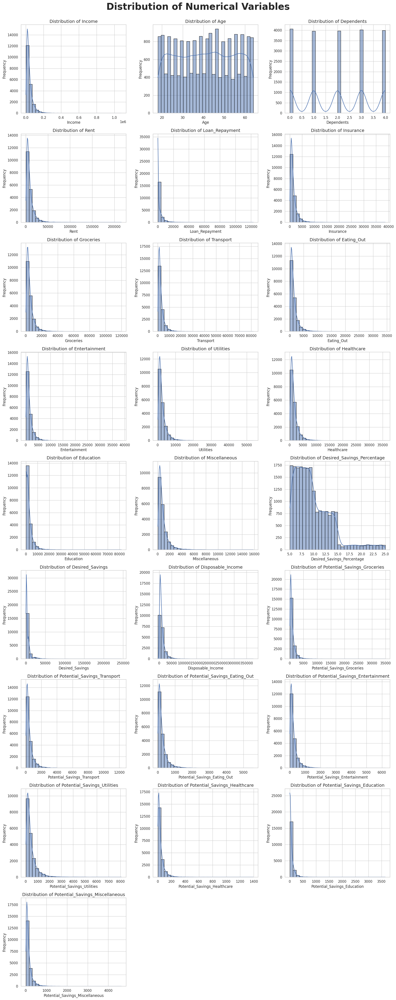

In [14]:
# Visualizing numeric variable distributions
sns.set(style="whitegrid")
numeric_cols = df.select_dtypes(include=['number']).columns
n_cols = 3
n_rows = (len(numeric_cols) + n_cols - 1) // n_cols
plt.figure(figsize=(n_cols * 6, n_rows * 5))
plt.suptitle("Distribution of Numerical Variables", fontsize=30, y=1, fontweight='bold')
for i, col in enumerate(numeric_cols, 1):
    plt.subplot(n_rows, n_cols, i)
    sns.histplot(df[col], bins=30, kde=True, edgecolor='black')
    plt.title(f'Distribution of {col}', fontsize=14)
    plt.xlabel(col, fontsize=12)
    plt.ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

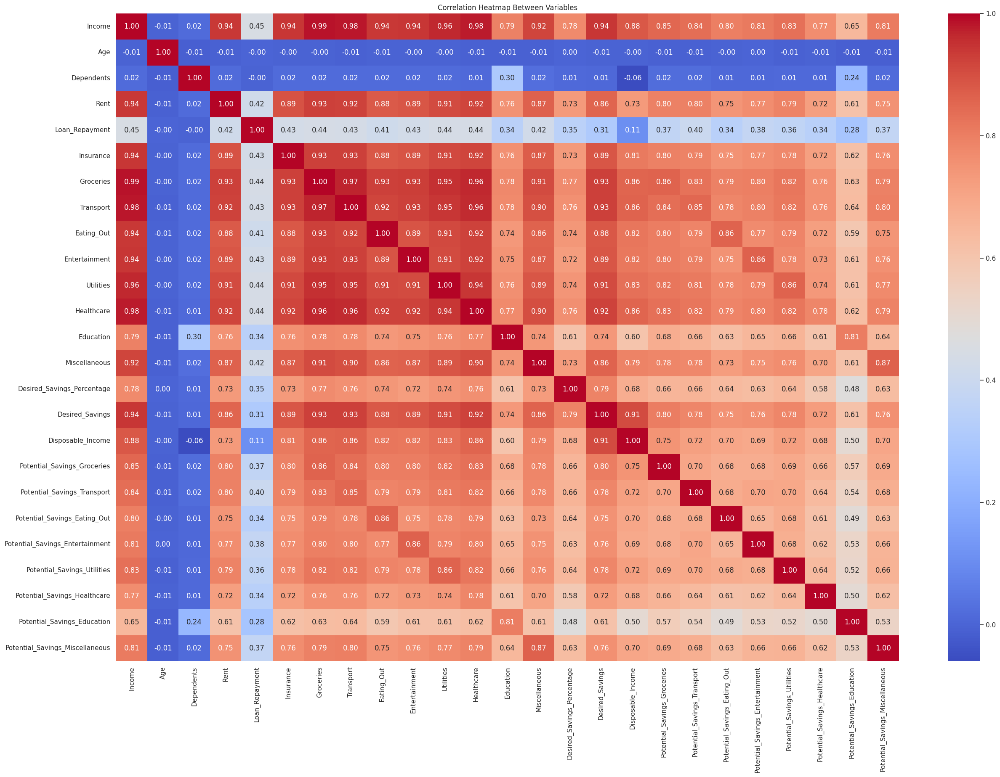

In [15]:
# Calculate correlation between numeric features
plt.figure(figsize=(30, 20))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap='coolwarm', fmt='.2f')
plt.title("Correlation Heatmap Between Variables")
plt.show()

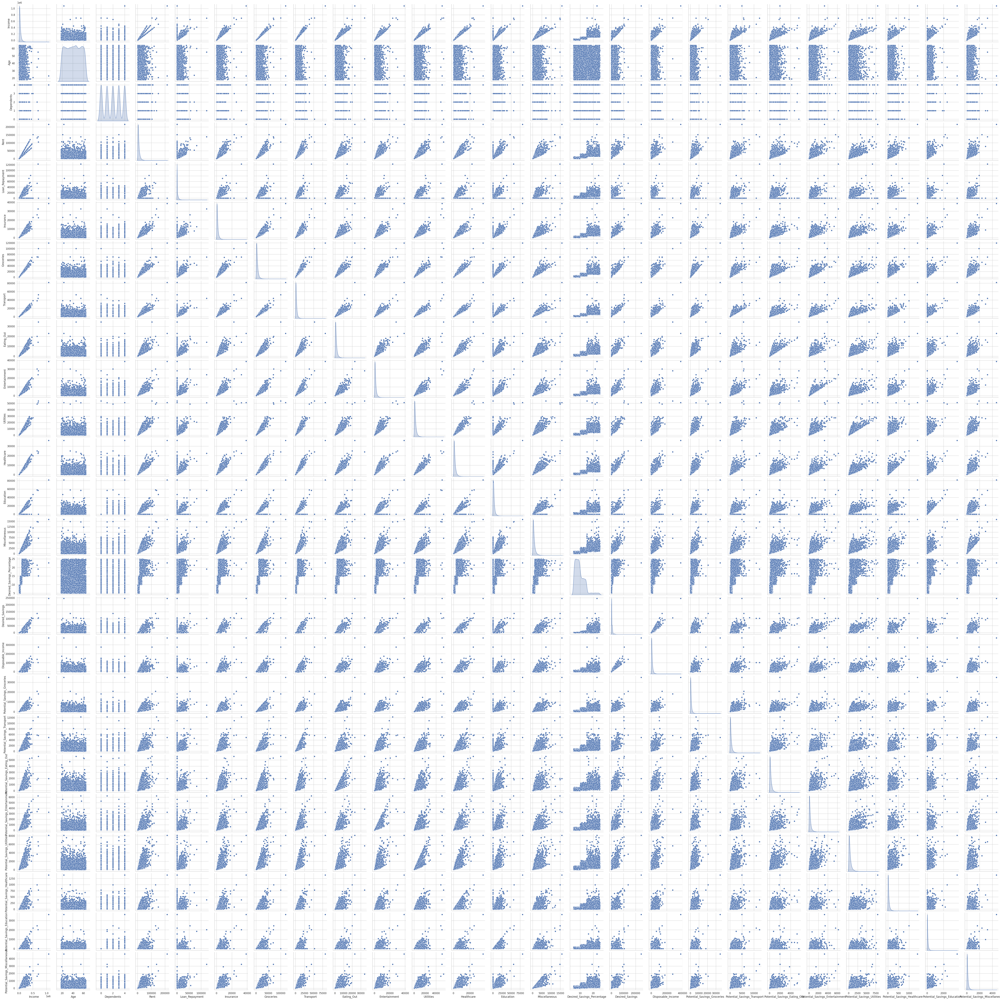

In [16]:
# Shows a visualization of the relationship between numeric features
sns.pairplot(df, diag_kind="kde")
plt.show()

# **4. Data Preprocessing**

In [17]:
# Drop irrelevant columns from the DataFrame
drop_columns = ['Age', 'Dependents', 'Occupation', 'City_Tier', 'Miscellaneous', 'Disposable_Income',
                'Potential_Savings_Groceries', 'Potential_Savings_Transport',
                'Potential_Savings_Eating_Out', 'Potential_Savings_Entertainment',
                'Potential_Savings_Utilities', 'Potential_Savings_Healthcare',
                'Potential_Savings_Education', 'Potential_Savings_Miscellaneous', 'Desired_Savings_Percentage', 'Desired_Savings']
df.drop(columns=drop_columns, inplace=True)
df_cleaned = df.copy()
df_cleaned.head()

,Income,Rent,Loan_Repayment,Insurance,Groceries,Transport,Eating_Out,Entertainment,Utilities,Healthcare,Education
0,44637.249636,13391.174891,0.000000,2206.490129,6658.768341,2636.970696,1651.801726,1536.184255,2911.792231,1546.914539,0.000000
1,26858.596592,5371.719318,0.000000,869.522617,2818.444460,1543.018778,649.378103,1050.241738,1626.143346,1137.351325,1551.723167
2,50367.605084,7555.140763,4612.103386,2201.800050,6313.222081,3221.396403,1513.814376,1723.306926,3368.457108,2178.515847,3160.026299
3,101455.600247,15218.340037,6809.441427,4889.418087,14690.149363,7106.130005,5040.249158,2858.194240,6128.550387,4571.118217,0.000000
4,24875.283548,4975.056710,3112.609398,635.907170,3034.329665,1276.155163,692.827225,660.186852,1092.689024,1169.095816,1445.215694


In [18]:
conversion_rate = 190
currency_cols = [
    'Income', 'Rent', 'Loan_Repayment', 'Insurance', 'Groceries', 'Transport',
    'Eating_Out', 'Entertainment', 'Utilities', 'Healthcare', 'Education',
]

# Pastikan kolom dalam format string dulu, hapus koma ribuan, lalu ubah ke float
for col in currency_cols:
    df_cleaned[col] = df_cleaned[col].astype(str).str.replace(',', '').astype(float)
# Kalikan dengan conversion_rate
df_cleaned[currency_cols] = df_cleaned[currency_cols] * conversion_rate
# Format tampilan float jadi tanpa desimal untuk print
pd.options.display.float_format = '{:,.0f}'.format
# Tampilkan hasil untuk verifikasi
print(df_cleaned[currency_cols].head())

      Income      Rent  Loan_Repayment  Insurance  Groceries  Transport  \
0  8,481,077 2,544,323               0    419,233  1,265,166    501,024   
1  5,103,133 1,020,627               0    165,209    535,504    293,174   
2  9,569,845 1,435,477         876,300    418,342  1,199,512    612,065   
3 19,276,564 2,891,485       1,293,794    928,989  2,791,128  1,350,165   
4  4,726,304   945,261         591,396    120,822    576,523    242,469   

   Eating_Out  Entertainment  Utilities  Healthcare  Education  
0     313,842        291,875    553,241     293,914          0  
1     123,382        199,546    308,967     216,097    294,827  
2     287,625        327,428    640,007     413,918    600,405  
3     957,647        543,057  1,164,425     868,512          0  
4     131,637        125,436    207,611     222,128    274,591  


In [19]:
expense_cols = [
    'Rent', 'Loan_Repayment', 'Insurance', 'Groceries', 'Transport',
    'Eating_Out', 'Entertainment', 'Utilities', 'Healthcare', 'Education'
]

# Buat kolom Total_Expenses
df_cleaned['Total_Expenses'] = df_cleaned[expense_cols].sum(axis=1)

In [20]:
df_cleaned['Expense_Income_Ratio'] = df_cleaned['Total_Expenses'] / (df_cleaned['Income'] + 1e-6)

In [21]:
features = df_cleaned[['Income', 'Total_Expenses', 'Expense_Income_Ratio']]

In [22]:
pd.options.display.float_format = '{:,.2f}'.format
print(df_cleaned[['Income', 'Total_Expenses', 'Expense_Income_Ratio']].head())

         Income  Total_Expenses  Expense_Income_Ratio
0  8,481,077.43    6,182,618.39                  0.73
1  5,103,133.35    3,157,333.14                  0.62
2  9,569,844.97    6,811,078.82                  0.71
3 19,276,564.05   12,789,202.27                  0.66
4  4,726,303.87    3,437,873.82                  0.73


In [23]:
features

,Income,Total_Expenses,Expense_Income_Ratio
0,"8,481,077.43","6,182,618.39",0.73
1,"5,103,133.35","3,157,333.14",0.62
2,"9,569,844.97","6,811,078.82",0.71
3,"19,276,564.05","12,789,202.27",0.66
4,"4,726,303.87","3,437,873.82",0.73
...,...,...,...
19995,"7,773,558.57","7,365,150.48",0.95
19996,"17,156,196.80","11,056,323.06",0.64
19997,"7,714,867.80","7,118,847.06",0.92
19998,"22,449,985.28","19,965,792.11",0.89


In [24]:
# Fungsi klasifikasi
def classify_ratio(ratio):
    if ratio > 0.75:
        return "Overspender"
    elif 0.65 <= ratio <= 0.75:
        return "Balanced"
    elif 0.50 <= ratio < 0.65:
        return "Beginner"
    else:
        return "Saver"

# Pastikan kolom tidak dalam format string (karena ada koma di angka)
features["Income"] = features["Income"].replace({',': ''}, regex=True).astype(float)
features["Total_Expenses"] = features["Total_Expenses"].replace({',': ''}, regex=True).astype(float)
features["Expense_Income_Ratio"] = features["Expense_Income_Ratio"].astype(float)

# Tambahkan kolom kategori berdasarkan rasio
features["Kategori"] = features["Expense_Income_Ratio"].apply(classify_ratio)

# Lihat hasilnya
print(features)

             Income  Total_Expenses  Expense_Income_Ratio     Kategori
0      8,481,077.43    6,182,618.39                  0.73     Balanced
1      5,103,133.35    3,157,333.14                  0.62     Beginner
2      9,569,844.97    6,811,078.82                  0.71     Balanced
3     19,276,564.05   12,789,202.27                  0.66     Balanced
4      4,726,303.87    3,437,873.82                  0.73     Balanced
...             ...             ...                   ...          ...
19995  7,773,558.57    7,365,150.48                  0.95  Overspender
19996 17,156,196.80   11,056,323.06                  0.64     Beginner
19997  7,714,867.80    7,118,847.06                  0.92  Overspender
19998 22,449,985.28   19,965,792.11                  0.89  Overspender
19999  1,559,757.46    1,364,658.20                  0.87  Overspender

[20000 rows x 4 columns]


<ipython-input-24-e446e756b288>:13: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features["Income"] = features["Income"].replace({',': ''}, regex=True).astype(float)
<ipython-input-24-e446e756b288>:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  features["Total_Expenses"] = features["Total_Expenses"].replace({',': ''}, regex=True).astype(float)
<ipython-input-24-e446e756b288>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_ind

In [25]:
# Menghitung jumlah tiap kategori
kategori_counts = features["Kategori"].value_counts()

# Menampilkan hasil
print(kategori_counts)

Kategori
Overspender    7917
Balanced       7260
Beginner       4796
Saver            27
Name: count, dtype: int64


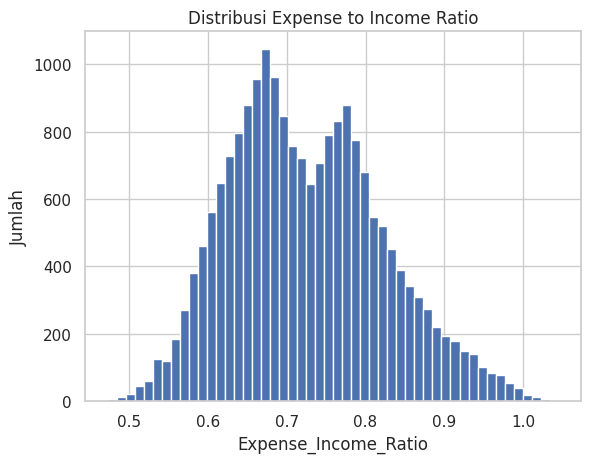

In [26]:
features["Expense_Income_Ratio"].hist(bins=50)
plt.title("Distribusi Expense to Income Ratio")
plt.xlabel("Expense_Income_Ratio")
plt.ylabel("Jumlah")
plt.show()

# Modeling

## Split X dan y

In [27]:
# Pisahkan fitur dan target
X = features.drop("Kategori", axis=1)
y = features["Kategori"]

In [28]:
# Optional: Standarisasi (jika fiturnya numeric)
numeric_features = X.select_dtypes(include=['float64', 'int']).columns.tolist()
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_features)
    ],
    remainder='passthrough'
)

# Split data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, stratify=y, test_size=0.3, random_state=42
)

## Scaling dan SMOTE

In [29]:
# Oversample only the training data
smote = SMOTE(random_state=42)
X_train_scaled = preprocessor.fit_transform(X_train)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_scaled, y_train)

# Model dengan class_weight
model = RandomForestClassifier(class_weight='balanced', random_state=42)

# Fit model ke data yang sudah di-resample
model.fit(X_train_resampled, y_train_resampled)

# Uji ke data test (yang tidak di-resample!)
X_test_scaled = preprocessor.transform(X_test)
y_pred = model.predict(X_test_scaled)

# Evaluasi hasil
print(classification_report(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))


              precision    recall  f1-score   support

    Balanced       1.00      1.00      1.00      2178
    Beginner       1.00      1.00      1.00      1439
 Overspender       1.00      1.00      1.00      2375
       Saver       0.80      1.00      0.89         8

    accuracy                           1.00      6000
   macro avg       0.95      1.00      0.97      6000
weighted avg       1.00      1.00      1.00      6000

[[2177    1    0    0]
 [   0 1437    0    2]
 [   0    0 2375    0]
 [   0    0    0    8]]


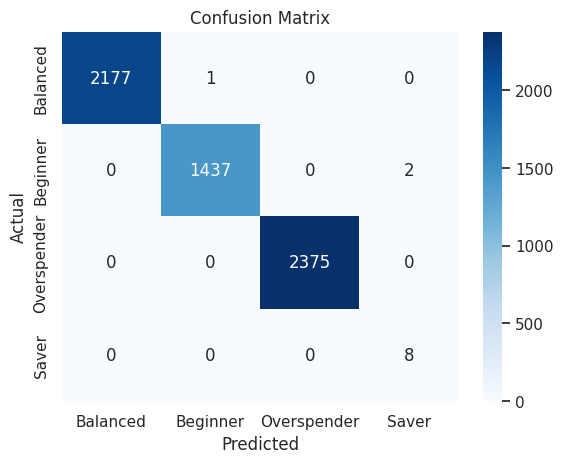

In [30]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, y_pred, labels=model.classes_)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=model.classes_, yticklabels=model.classes_)
plt.ylabel('Actual')
plt.xlabel('Predicted')
plt.title('Confusion Matrix')
plt.show()

# Inference

In [31]:
# Contoh data baru, tanpa kolom Expense_Income_Ratio
data_baru = pd.DataFrame({
    'Income': [8500000, 4000000],
    'Total_Expenses': [6000000, 10000000],
})

# Hitung kolom Expense_Income_Ratio otomatis
data_baru['Expense_Income_Ratio'] = data_baru['Total_Expenses'] / data_baru['Income']

# Preprocess data baru
data_baru_scaled = preprocessor.transform(data_baru)

# Predict dengan model
prediksi = model.predict(data_baru_scaled)

print("Prediksi kategori:", prediksi)

Prediksi kategori: ['Balanced' 'Overspender']


# Save Model


In [32]:
import joblib

# Simpan model
joblib.dump(model, 'model_rf.pkl')

# Simpan preprocessor (scaler, transformer, dsb.)
joblib.dump(preprocessor, 'preprocessor.pkl')

['preprocessor.pkl']